In [1]:
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.0/190.0 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.8/224.8 kB 12.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.7 MB/s eta 0:00:00
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8791 sha256=1527669cbd150da1b8f40eef9792bdb011c671319f0e6c5bc6c7a12e359e4efe
  Stored in directory: /root/.cache/pip/wheels/e7/f3/22/152153d6eb222ee7a56ff8617d80ee5207207a8c00a7aab794
Successfully built pathtools


In [2]:
import os
import wandb
import matplotlib.pyplot as plt
import torch
from PIL import Image

In [3]:
!wandb login --relogin
wandb.login()

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


wandb: Currently logged in as: parshin_d (dentist_ai). Use `wandb login --relogin` to force relogin


True

In [4]:
# Подключение гугл диска
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#run = wandb.init(
#    entity="dentist_ai",
#    project="Dentist_AI")

In [ ]:
# Скачивание датасета с wandb.

path_to_data = "drive/MyDrive/Colab Notebooks/ML_System_Design/data/xd_n.v1i_Caries_v0-v0"

if os.path.isdir(path_to_data):
    artifact_dir = path_to_data
else:
    artifact = run.use_artifact("dentist_ai/Dentist_AI/xd_n.v1i_Caries_v0:v0", type="dataset")
    artifact_dir = artifact.download(path_to_data)

In [5]:
# Переходим в папку YOLO куда будем копировать данные с гитхаба
%cd drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5

# Копируем данные с гитхаба
!git clone https://github.com/ultralytics/yolov5

# После копирования переходим в папку yolov5 и ставим список библиотек из файла
%cd yolov5
%pip install -qr requirements.txt

/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5
fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.1/631.1 kB 6.3 MB/s eta 0:00:00


In [6]:
%cd /content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5

/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5


In [13]:
# Задаём параметры обучения модели. Размер картинок 416 на 416 (такой размер фото в датасете).
# Батчсайз 4, количество эпох 80.
# Интервал сохранения пример валидации в wandb
# Путь к yaml файлу где указано количество классов и пути к папкам с картинками
# Стартовые веса (маленькая/средняя/большая модель)

!python train.py --img 416\
--batch 4\
--epochs 80\
--project Dentist_AI \
--data '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/xd_n.v1i_Caries_v0-v0/data.yaml'\
--weights yolov5m6.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: Currently logged in as: parshin_d (dentist_ai). Use `wandb login --relogin` to force relogin
train: weights=yolov5m6.pt, cfg=, data=/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/xd_n.v1i_Caries_v0-v0/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=80, batch_size=4, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=Dentist_AI, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 2 commits. Use 'git pull' or 'git c

In [22]:
# Выведем графики обучения модели (укажем путь к картинке в которую сохраняется результат)
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp3/results.png'))

In [18]:
# Путь куда сохранялись веса дообученной модели
# Путь к папке с файлами yolo
model_path = '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp3/weights/best.pt'
yolo_path = '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5'

# Загрузка модели из торч хаб и загрузка в неё ранее сохранённых весов
model = torch.hub.load(yolo_path, 'custom', path=model_path, source='local')

# Путь к тестовым картинкам
path_to_test = "/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/xd_n.v1i_Caries_v0-v0/test/images/"
test_list = os.listdir(path_to_test)

YOLOv5 🚀 2023-9-25 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 276 layers, 35248920 parameters, 0 gradients, 48.9 GFLOPs
Adding AutoShape... 


In [19]:
# Запустим проверку работы сохраненной обученной модели на тестовом датасете.

!python detect.py --source '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/xd_n.v1i_Caries_v0-v0/test/images/' --weights '/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp3/weights/best.pt' --img 416 --save-txt --save-crop

detect: weights=['/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/Dentist_AI/exp3/weights/best.pt'], source=/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/xd_n.v1i_Caries_v0-v0/test/images/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/content/drive/MyDrive/Colab': No such file or directory
YOLOv5 🚀 2023-9-25 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 276 layers, 35248920 parameters, 0 gradients, 48.9 GFLOPs
WARNING ⚠️ --img-size [416, 416] must be multiple of max stride 64, updating to [448, 448]
image 1/51 /content/

In [20]:
# Путь до сохраненных результатов работы модели на тетовом множестве.
path_to_output = "/content/drive/MyDrive/Colab Notebooks/ML_System_Design/YOLO5/yolov5/runs/detect/exp3/"
output_list = os.listdir(path_to_test)

print(output_list)

['465_jpg.rf.550abec755a34a6f5db21026a1da7c29.jpg', '535_jpg.rf.172d66fed3ba35112e7c316923f26920.jpg', '0_-44-_jpg.rf.27f4b44d5bebb335b6ea91dcdac7759a.jpg', '548_jpg.rf.ba6aa1905d5376161f6e053a315aeff3.jpg', '562_jpg.rf.942f7d0c484a7bbc1442999a6a3975f3.jpg', '1202_jpg.rf.233f7c565431c3e0930c42326c86233c.jpg', '901_jpg.rf.8eb789dfc72ffe9e7ceb7ddf2ad6c4c4.jpg', '1205_jpg.rf.a3d32eb9dfd282f5890626a30c5049ae.jpg', '404_jpg.rf.7f8d62b7f6e8950b075364b6d82962d5.jpg', '1024_jpg.rf.4dd60d62e26bca30b10e6439e8b60289.jpg', '686_jpg.rf.a9e4b3f07cc11502c110e26578847bb5.jpg', '1147_jpg.rf.b88fd2af3012729cf96c8c17f43a0407.jpg', '1107_jpg.rf.294869e14fc4193a138663a3b1a1c8aa.jpg', '130_jpg.rf.a9787eb6696306350ee549826c0eaa1d.jpg', '882_jpg.rf.a6779f60368d3bf67c1279ca914c7525.jpg', '1174_jpg.rf.7caf4d60eb5ae985cd67e850232ccb70.jpg', '676_jpg.rf.1134a0c00b9d5a7a773906a23db4a1d2.jpg', '1039_jpg.rf.40138ede848236ed69b1799b583a5453.jpg', '874_jpg.rf.cd1d9863cca7d1600200884b04fcae57.jpg', '599_jpg.rf.27b1eeae

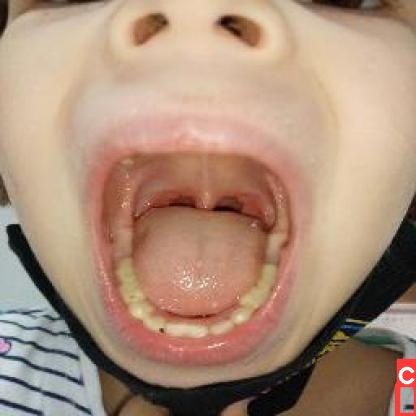

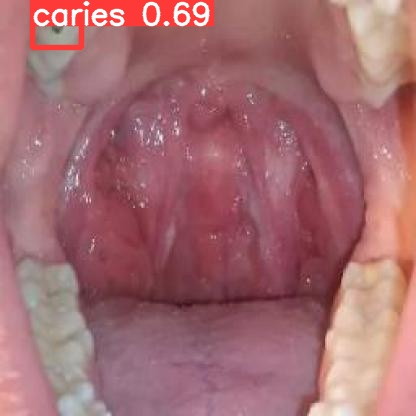

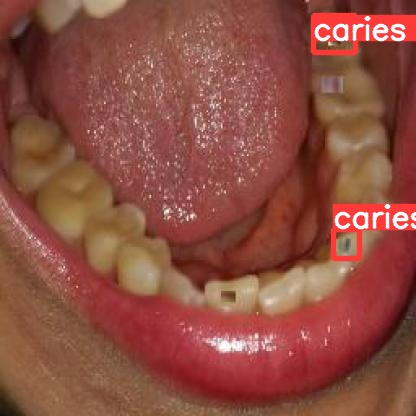

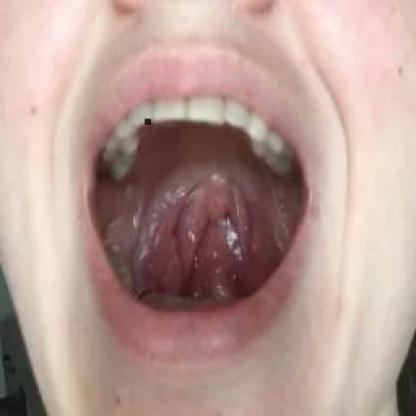

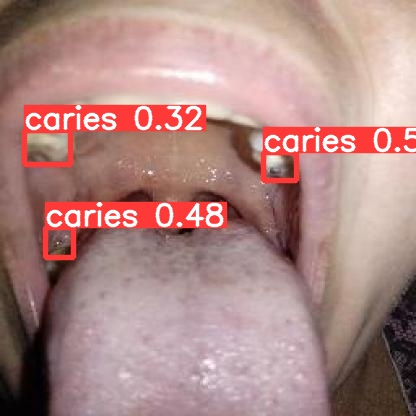

...

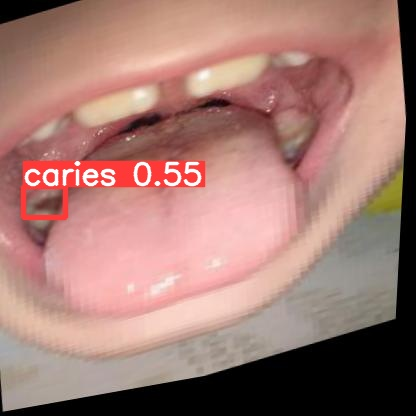

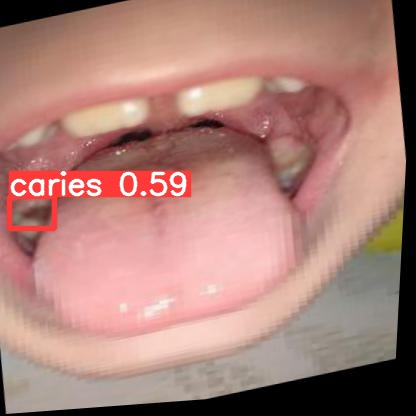

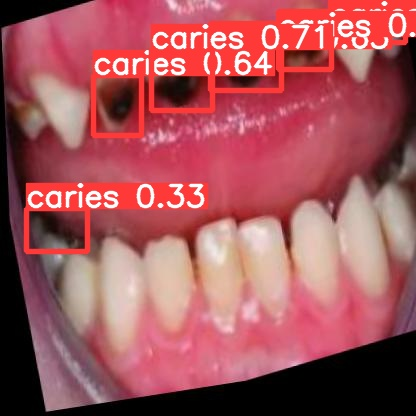

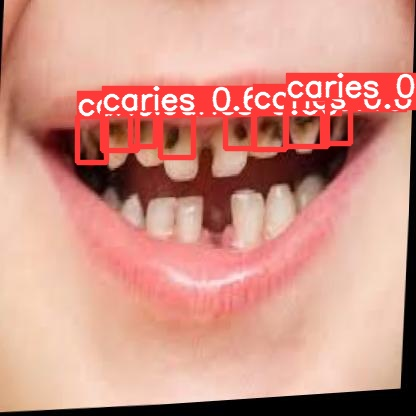

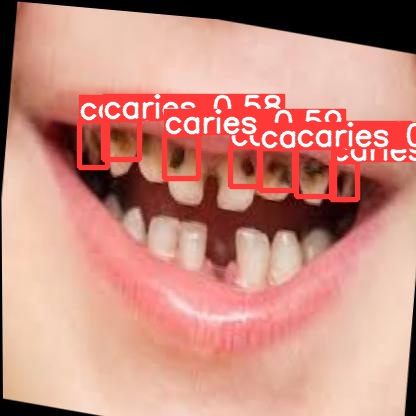

In [21]:
# Посмотрим на результат работы модели. Выведем изображения с боксами.
for out in output_list:
  image = Image.open(path_to_output + out)
  display(image)